# MLLM-Microscope

## ScienceQA Dataset

In [1]:
from mllm_microscope import MllmMicroscope
from datasets import load_dataset
import numpy as np

In [2]:
N_EXAMPLES = 16
SPLIT = 'test'

# Load the ScienceQA dataset
ds = load_dataset("derek-thomas/ScienceQA")

# Sample examples from the dataset uniformly at random.
# Both the LLaVA-NeXT and OmniFusion models will use the same examples
data_sampled_indices = np.random.choice(len(ds[SPLIT]), N_EXAMPLES).tolist()

In [3]:
device = "cuda:1"
model_names = [
    "LLaVA-NeXT",
    "OmniFusion",
]

mllm_microscope = MllmMicroscope(device=device)

In [4]:
texts, images = [], []
for i in data_sampled_indices:
    entry = ds[SPLIT][i]
    image = entry['image'] if entry['image'] else None
    # if not image: continue  # For now, skip the text-only examples
    question = entry['question']
    choices = entry['choices']
    answer = entry['answer']
    hint = entry['hint']
    lecture = entry['lecture']
    solution = entry['solution']

    # Prepare the question
    # text = f"Question: {question}\nChoices: {', '.join(choices)}\nLecture: {lecture}"
    text = f"Question: {question}\nChoices: {', '.join(choices)}"

    texts.append(text)
    images.append(image)

In [5]:
# Obtain intermediate embeddings for LLaVA-NeXT
llava_next_embs = mllm_microscope.get_intermediate_embeddings(model_name=model_names[0], texts=texts, images=images)

Initializing the LLaVA-NeXT model...


Loading checkpoint shards:   0%|          | 0/4 [00:00<?, ?it/s]

Computing the intermediate embeddings for the LLaVA-NeXT model...


  0%|          | 0/16 [00:00<?, ?it/s]

[INST] <image>
Question: Think about the magnetic force between the magnets in each pair. Which of the following statements is true?
Choices: The magnitude of the magnetic force is smaller in Pair 2., The magnitude of the magnetic force is smaller in Pair 1., The magnitude of the magnetic force is the same in both pairs. [/INST]


We detected that you are passing `past_key_values` as a tuple and this is deprecated and will be removed in v4.43. Please use an appropriate `Cache` class (https://huggingface.co/docs/transformers/v4.41.3/en/internal/generation_utils#transformers.Cache)
  6%|▋         | 1/16 [00:02<00:30,  2.04s/it]

[INST] <image>
Question: Complete the sentence.
The Western Alps formed at a () boundary.
Choices: transform, convergent, divergent [/INST]


 12%|█▎        | 2/16 [00:02<00:16,  1.18s/it]

[INST] Question: Which tense does the sentence use?
Akiko teaches Norma about customs in Japan.
Choices: past tense, future tense, present tense [/INST]


 19%|█▉        | 3/16 [00:03<00:10,  1.21it/s]

[INST] <image>
Question: Will these magnets attract or repel each other?
Choices: repel, attract [/INST]


 25%|██▌       | 4/16 [00:03<00:07,  1.64it/s]

[INST] <image>
Question: What is the probability that a Syrian hamster produced by this cross will have wavy fur?
Choices: 3/4, 2/4, 4/4, 0/4, 1/4 [/INST]


 31%|███▏      | 5/16 [00:03<00:06,  1.71it/s]

[INST] <image>
Question: Select the reptile below.
Choices: clownfish, helmeted iguana [/INST]


 38%|███▊      | 6/16 [00:04<00:04,  2.02it/s]

[INST] <image>
Question: Which animal's neck is also adapted for hunting prey while keeping the rest of its body still?
Choices: northern pintail, black-headed heron [/INST]


 44%|████▍     | 7/16 [00:04<00:03,  2.33it/s]

[INST] Question: Based on this information, what is Angel's genotype for the leg color gene?
Choices: ll, yellow legs [/INST]
[INST] <image>
Question: Which country is highlighted?
Choices: The Bahamas, Trinidad and Tobago, Cuba, Grenada [/INST]


 62%|██████▎   | 10/16 [00:06<00:02,  2.07it/s]

[INST] Question: Which sentence states a fact?
Choices: "Shooting stars" are really bits of rock and dust burning up in Earth's atmosphere., Camping in the woods is the best way to see shooting stars. [/INST]
[INST] <image>
Question: Which better describes the tide pool ecosystems in Tongue Point Marine Life Sanctuary?
Choices: It has no sunlight. It also has daily flooding and draining of seawater., It has daily flooding and draining of seawater. It also has many different types of organisms. [/INST]


 69%|██████▉   | 11/16 [00:06<00:02,  1.93it/s]

[INST] <image>
Question: What is the capital of Oregon?
Choices: Boston, Portland, Salem, Jefferson City [/INST]


 75%|███████▌  | 12/16 [00:07<00:02,  1.56it/s]

[INST] <image>
Question: What is the capital of Arizona?
Choices: Phoenix, Baton Rouge, Fort Wayne, Juneau [/INST]


 88%|████████▊ | 14/16 [00:08<00:01,  1.72it/s]

[INST] Question: Select the living thing.
Choices: hockey puck, yeast, snowman, swing set [/INST]
[INST] Question: Last year, 50,000 people lived in the city of Millersburg. But since then, 8,000 people have moved away. What probably happened to the overall supply of houses for sale in Millersburg?
Choices: The supply probably went down., The supply probably went up. [/INST]
[INST] <image>
Question: What is the capital of Massachusetts?
Choices: Albany, Annapolis, Cambridge, Boston [/INST]


100%|██████████| 16/16 [00:10<00:00,  1.58it/s]


In [6]:
# Obtain intermediate embeddings for OmniFusion
omnifusion_embs = mllm_microscope.get_intermediate_embeddings(model_name=model_names[1], texts=texts, images=images)

Initializing the OmniFusion model...


Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

/home/ra.mussabayev/AIRI/mllm_microscope.py:233: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.omnifusion_projection = torch.load("OmniMistral-v1_1/projection.pt", map_

Computing the intermediate embeddings for the OmniFusion model...


  0%|          | 0/16 [00:00<?, ?it/s]

<image>
Question: Think about the magnetic force between the magnets in each pair. Which of the following statements is true?
Choices: The magnitude of the magnetic force is smaller in Pair 2., The magnitude of the magnetic force is smaller in Pair 1., The magnitude of the magnetic force is the same in both pairs.


 12%|█▎        | 2/16 [00:00<00:05,  2.51it/s]

<image>
Question: Complete the sentence.
The Western Alps formed at a () boundary.
Choices: transform, convergent, divergent
Question: Which tense does the sentence use?
Akiko teaches Norma about customs in Japan.
Choices: past tense, future tense, present tense


 25%|██▌       | 4/16 [00:01<00:03,  3.68it/s]

<image>
Question: Will these magnets attract or repel each other?
Choices: repel, attract
<image>
Question: What is the probability that a Syrian hamster produced by this cross will have wavy fur?
Choices: 3/4, 2/4, 4/4, 0/4, 1/4


 38%|███▊      | 6/16 [00:01<00:02,  4.30it/s]

<image>
Question: Select the reptile below.
Choices: clownfish, helmeted iguana
<image>
Question: Which animal's neck is also adapted for hunting prey while keeping the rest of its body still?
Choices: northern pintail, black-headed heron


 44%|████▍     | 7/16 [00:01<00:01,  4.91it/s]

Question: Based on this information, what is Angel's genotype for the leg color gene?
Choices: ll, yellow legs
<image>
Question: Which country is highlighted?
Choices: The Bahamas, Trinidad and Tobago, Cuba, Grenada


 56%|█████▋    | 9/16 [00:02<00:01,  6.16it/s]

Question: Which sentence states a fact?
Choices: "Shooting stars" are really bits of rock and dust burning up in Earth's atmosphere., Camping in the woods is the best way to see shooting stars.
<image>
Question: Which better describes the tide pool ecosystems in Tongue Point Marine Life Sanctuary?
Choices: It has no sunlight. It also has daily flooding and draining of seawater., It has daily flooding and draining of seawater. It also has many different types of organisms.


 75%|███████▌  | 12/16 [00:02<00:00,  6.33it/s]

<image>
Question: What is the capital of Oregon?
Choices: Boston, Portland, Salem, Jefferson City
<image>
Question: What is the capital of Arizona?
Choices: Phoenix, Baton Rouge, Fort Wayne, Juneau


 81%|████████▏ | 13/16 [00:02<00:00,  6.44it/s]

Question: Select the living thing.
Choices: hockey puck, yeast, snowman, swing set
Question: Last year, 50,000 people lived in the city of Millersburg. But since then, 8,000 people have moved away. What probably happened to the overall supply of houses for sale in Millersburg?
Choices: The supply probably went down., The supply probably went up.


100%|██████████| 16/16 [00:03<00:00,  4.50it/s]


<image>
Question: What is the capital of Massachusetts?
Choices: Albany, Annapolis, Cambridge, Boston


In [7]:
# Analyze LLaVA-NeXT intermediate embeddings
all_results = mllm_microscope.analyze_embeddings(model_name=model_names[0], ps=True, psc=True, in_d=True, an=True)

Starting tests for the model LLaVA-NeXT...
Text embs shape:  torch.Size([763, 4096])
Image embs shape:  torch.Size([15628, 4096])


LLaVA-NeXT image anisotropy: 100%|██████████| 32/32 [01:12<00:00,  2.26s/it]


In [8]:
# Analyze OmniFusion intermediate embeddings
all_results = mllm_microscope.analyze_embeddings(model_name=model_names[1], ps=True, psc=True, in_d=True, an=True)

Starting tests for the model OmniFusion...
Text embs shape:  torch.Size([800, 4096])
Image embs shape:  torch.Size([6336, 4096])


OmniFusion image anisotropy: 100%|██████████| 31/31 [01:05<00:00,  2.10s/it]


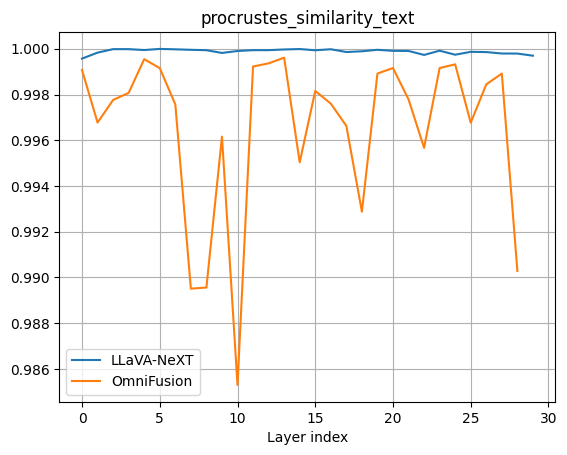

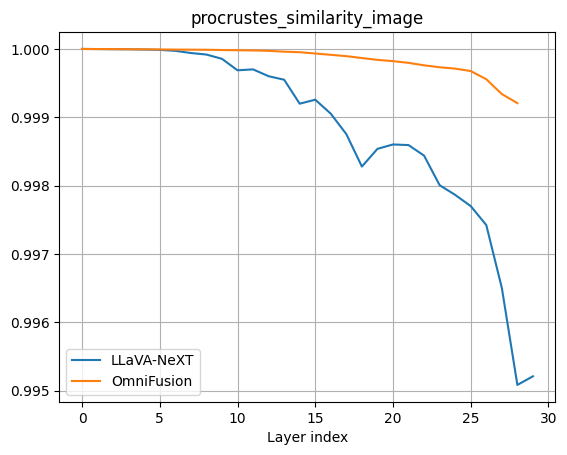

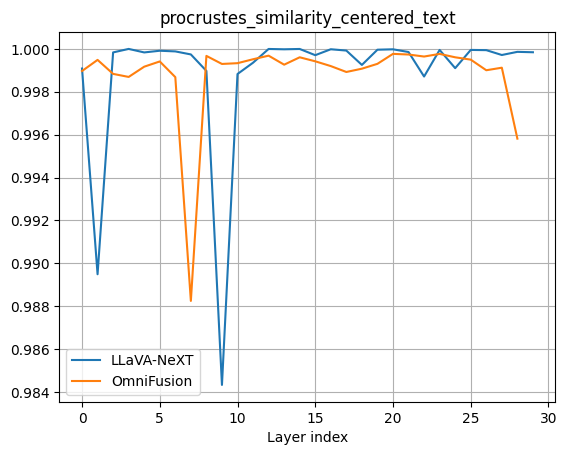

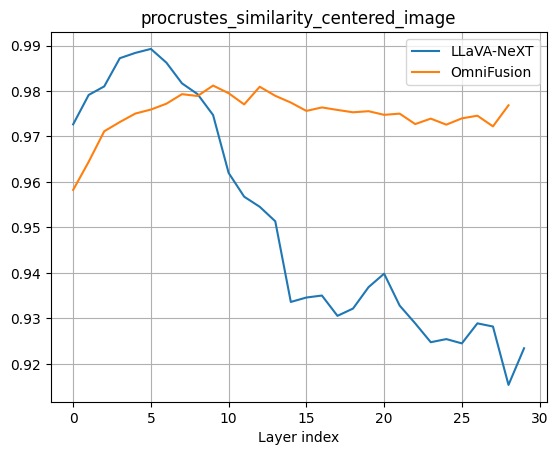

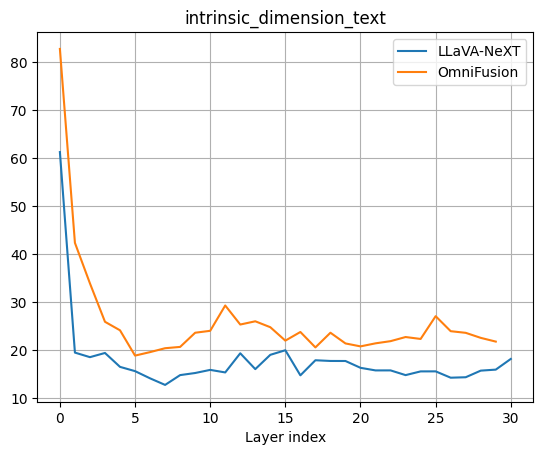

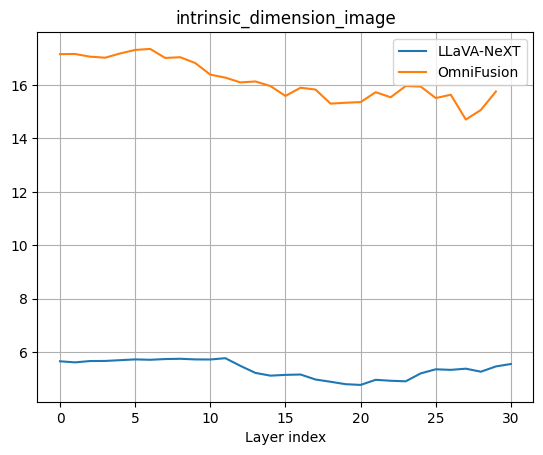

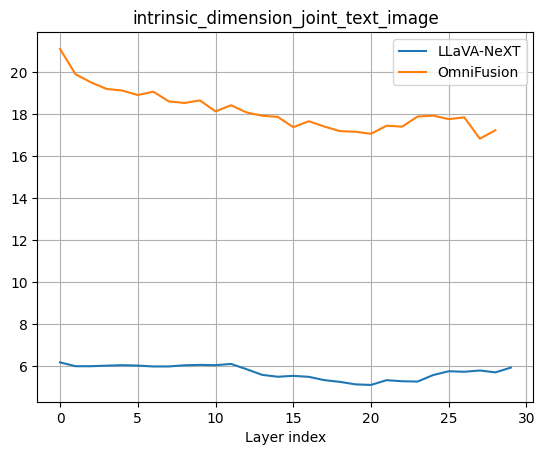

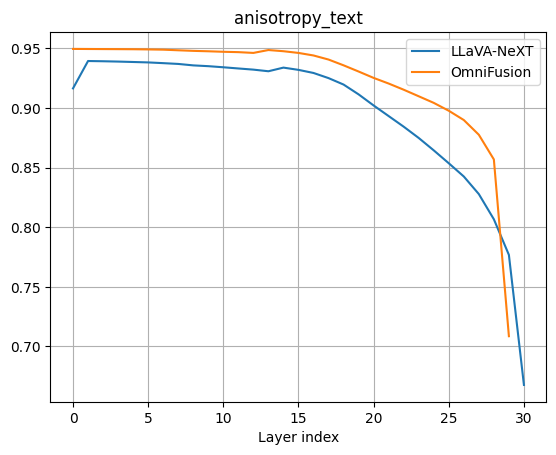

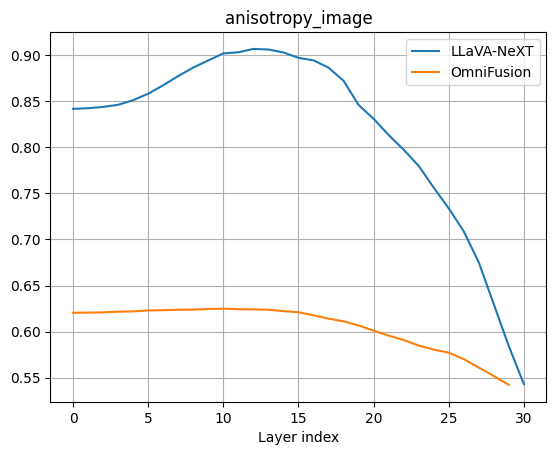

In [9]:
# Plot the obtained model scores
mllm_microscope.plot_results(saving_path="./linearity_results")

/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


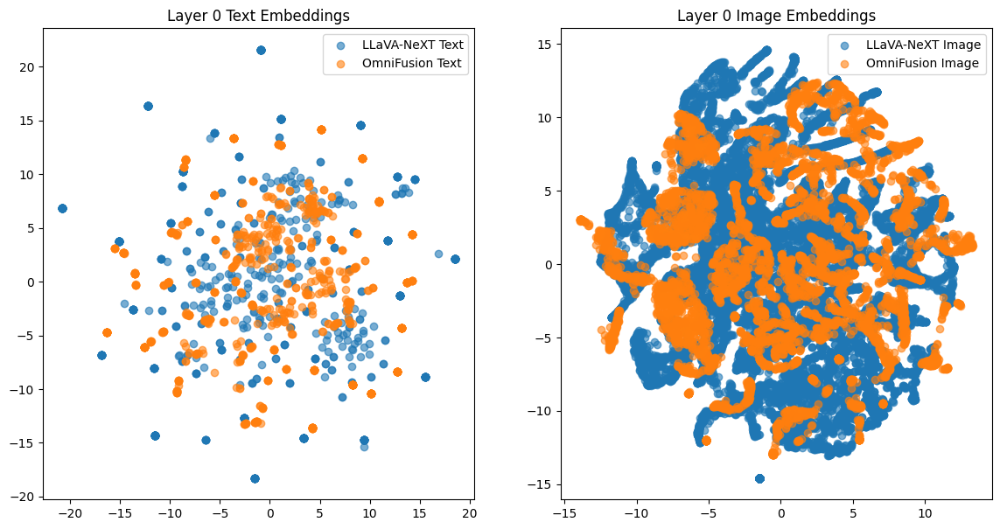

/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


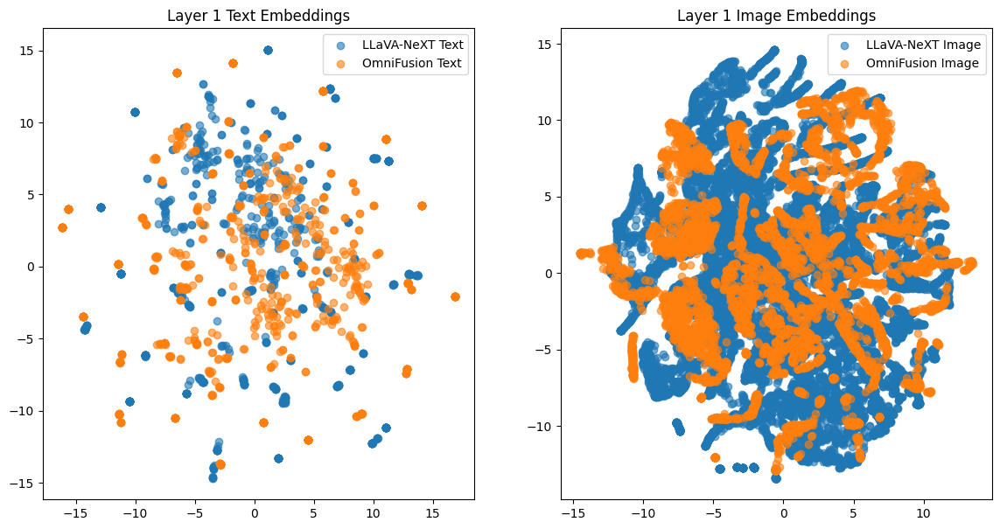

/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


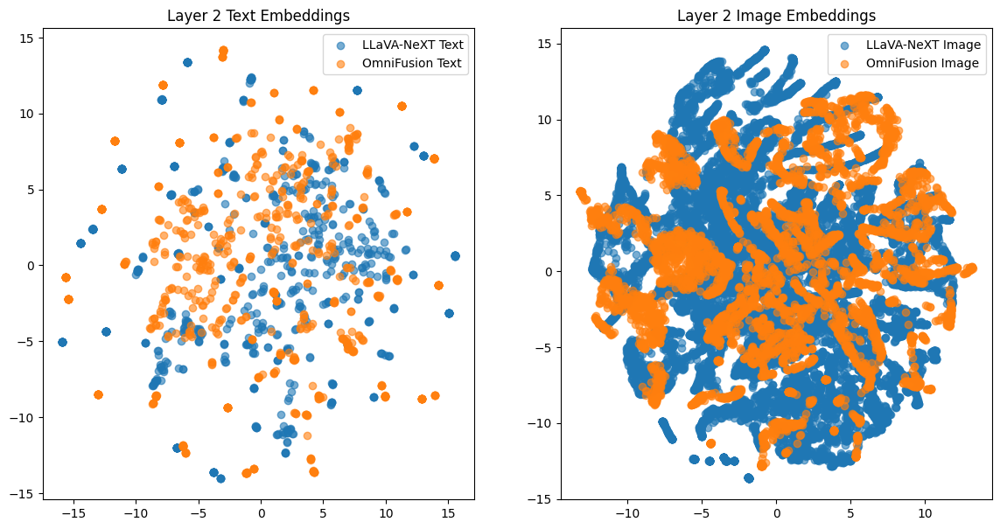

/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


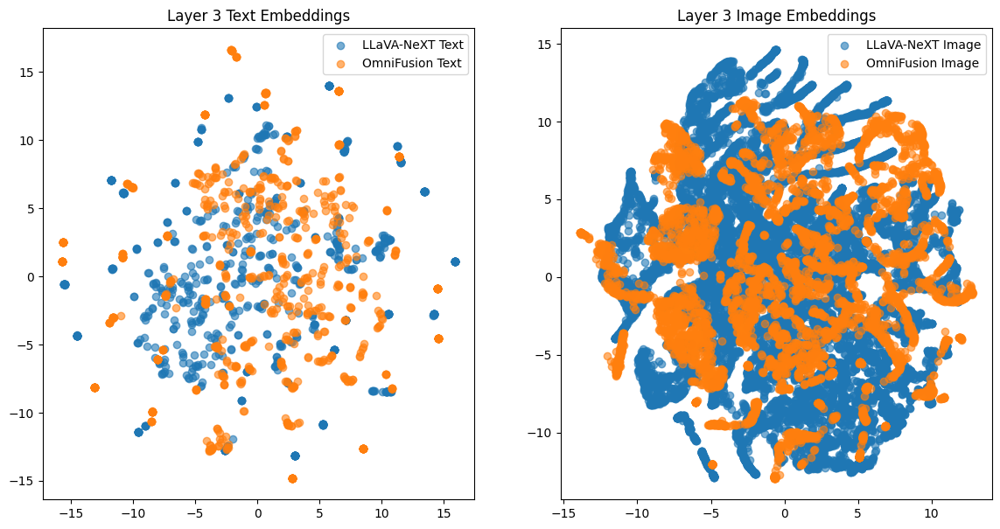

/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


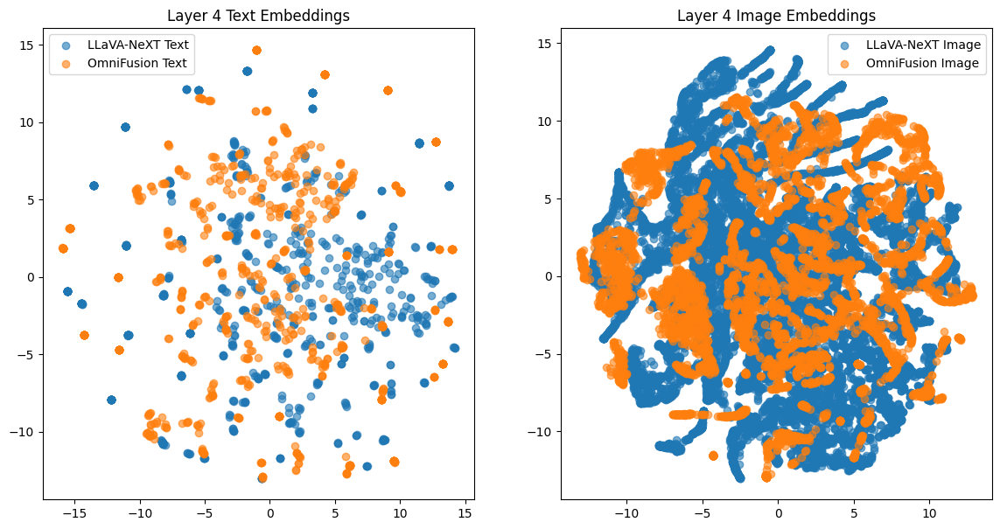

/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


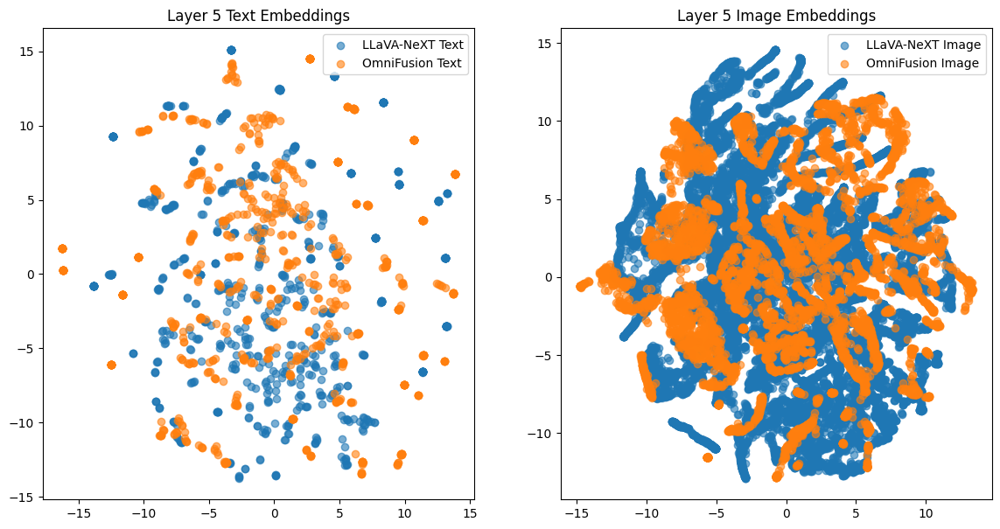

/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


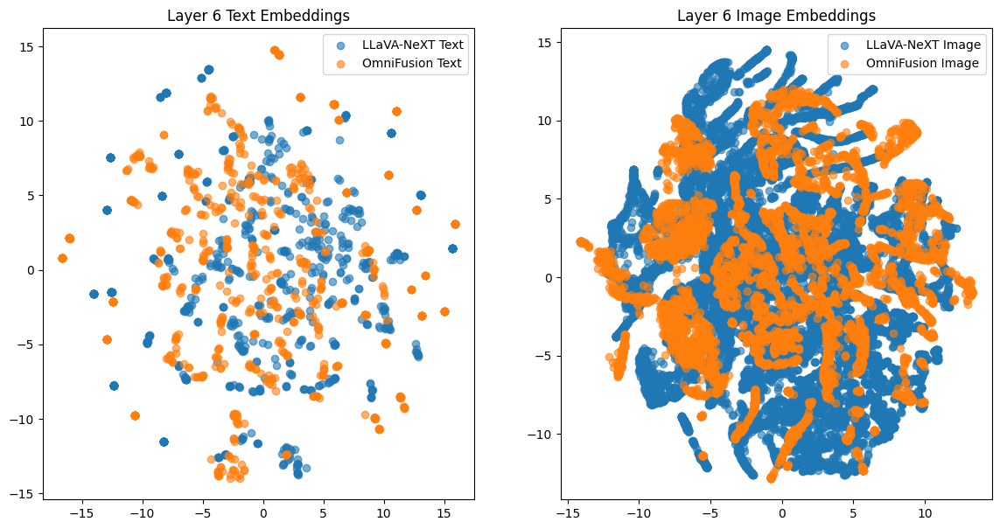

/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


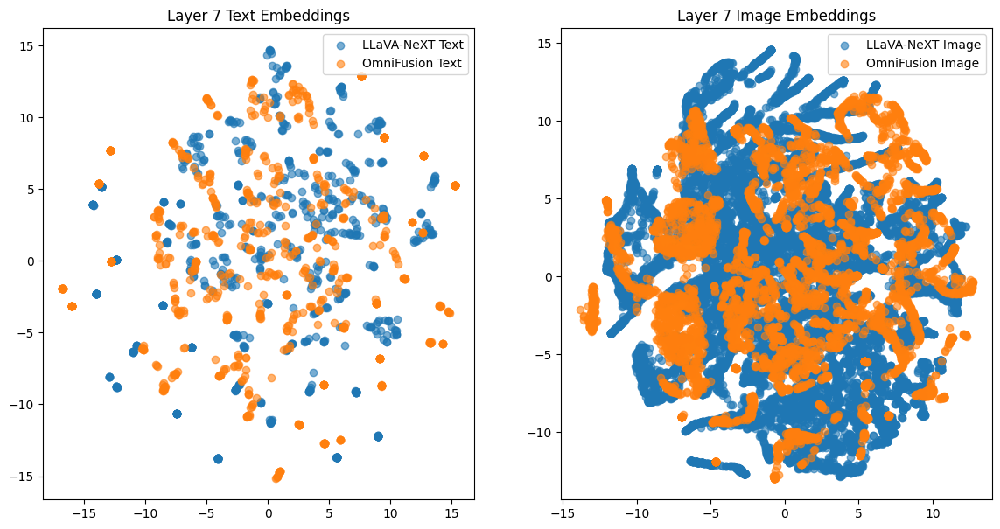

/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


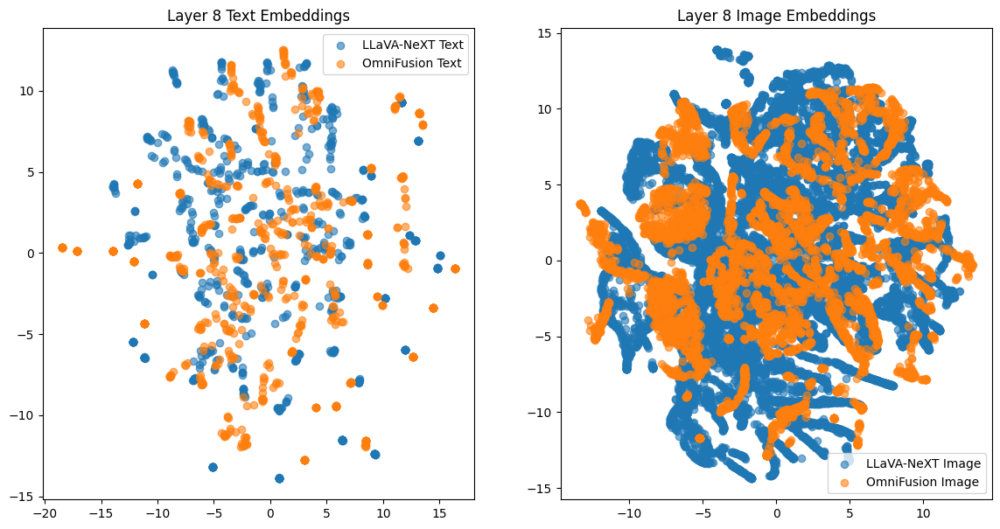

/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


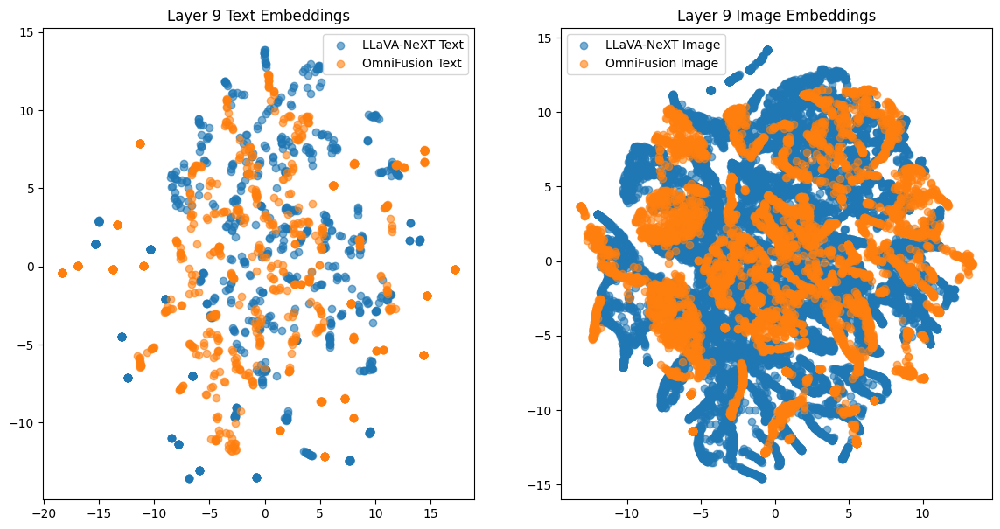

/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


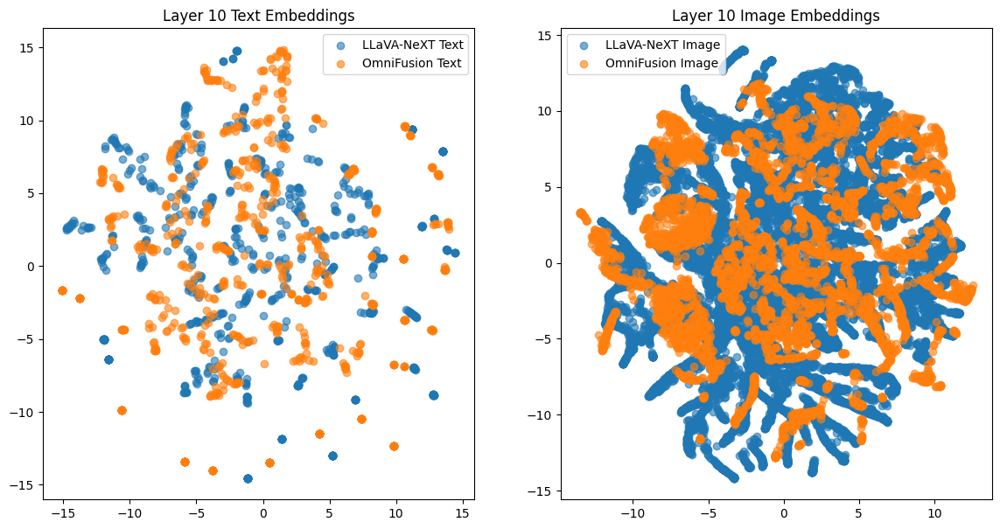

/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


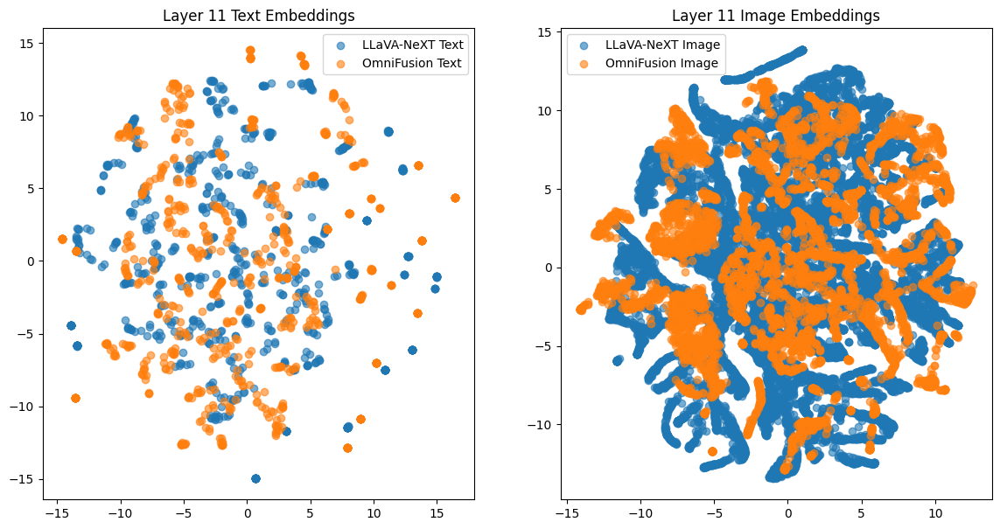

/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


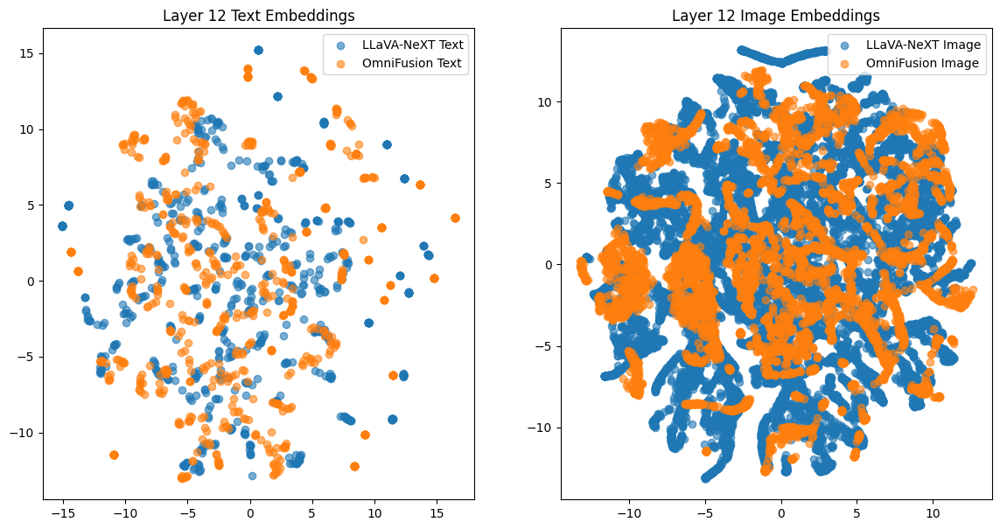

/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


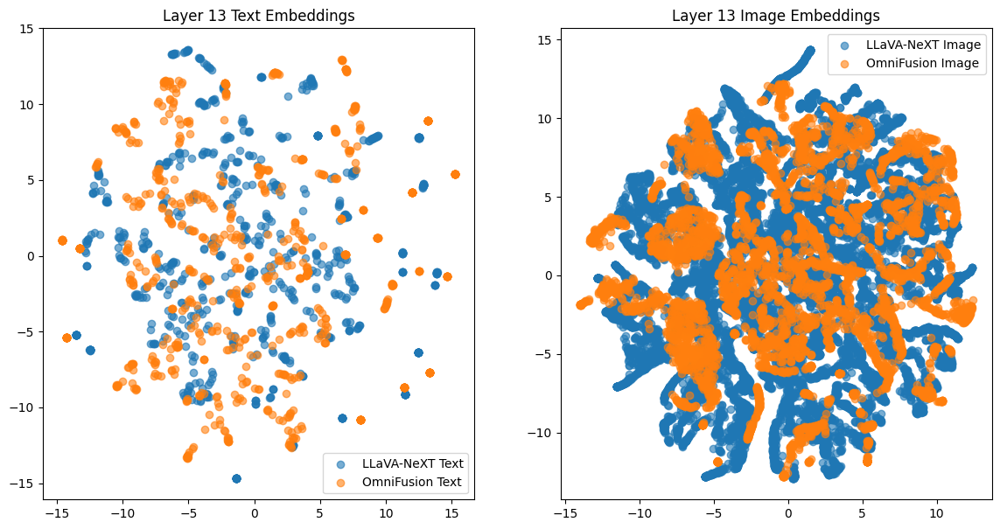

/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


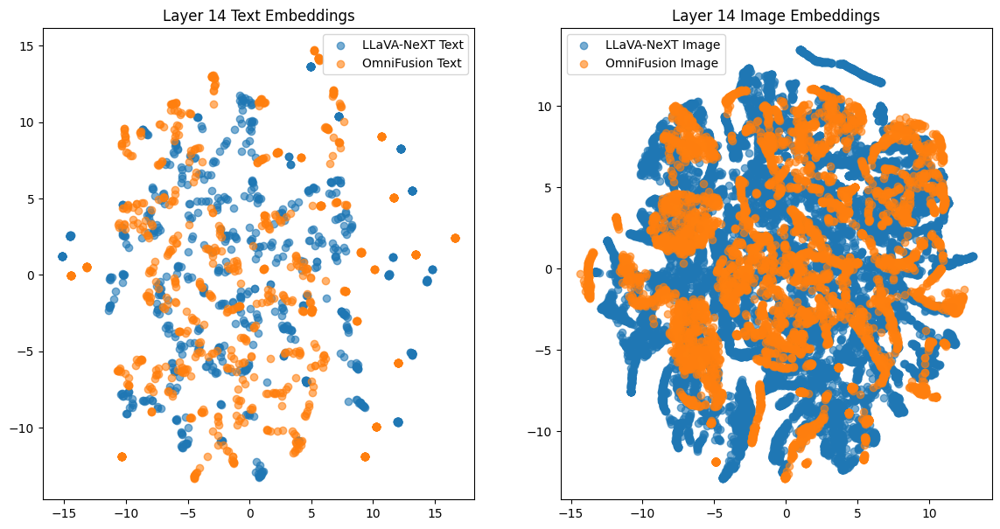

/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


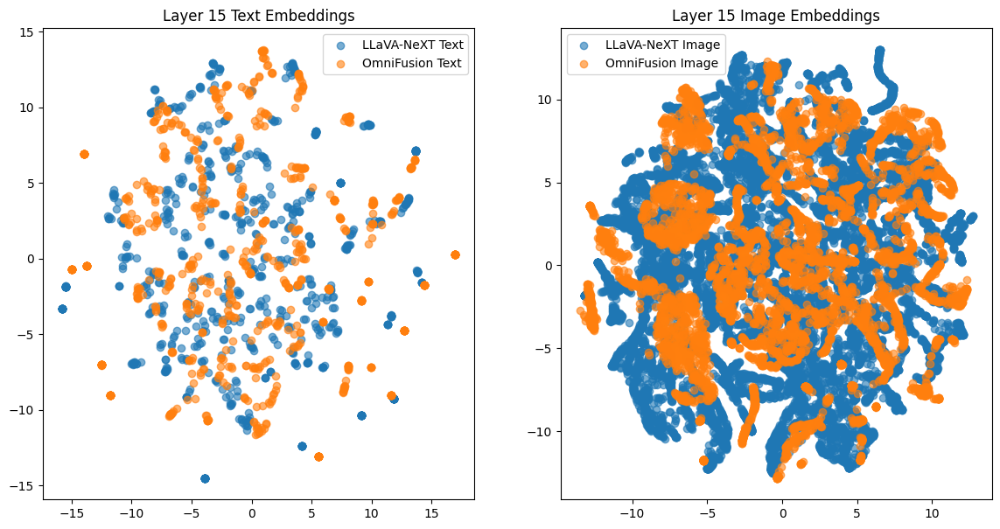

/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


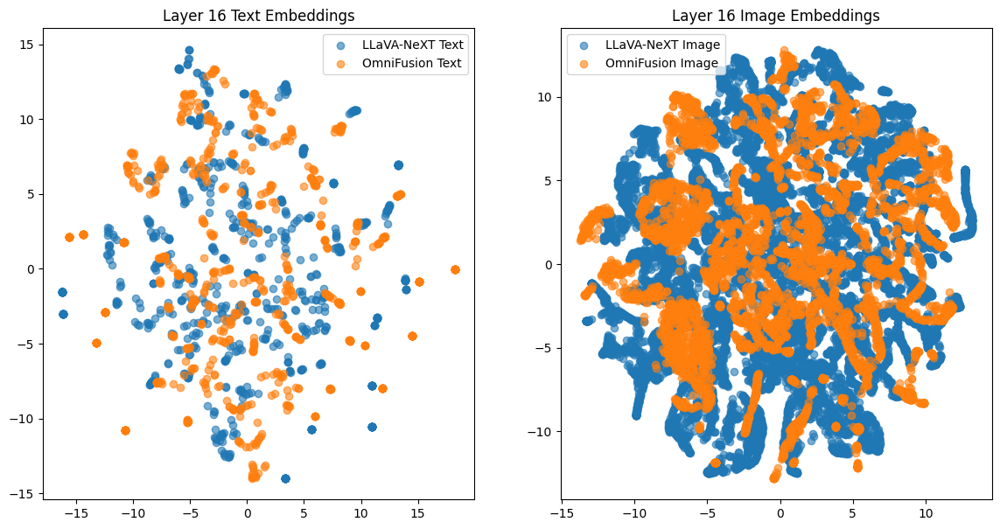

/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


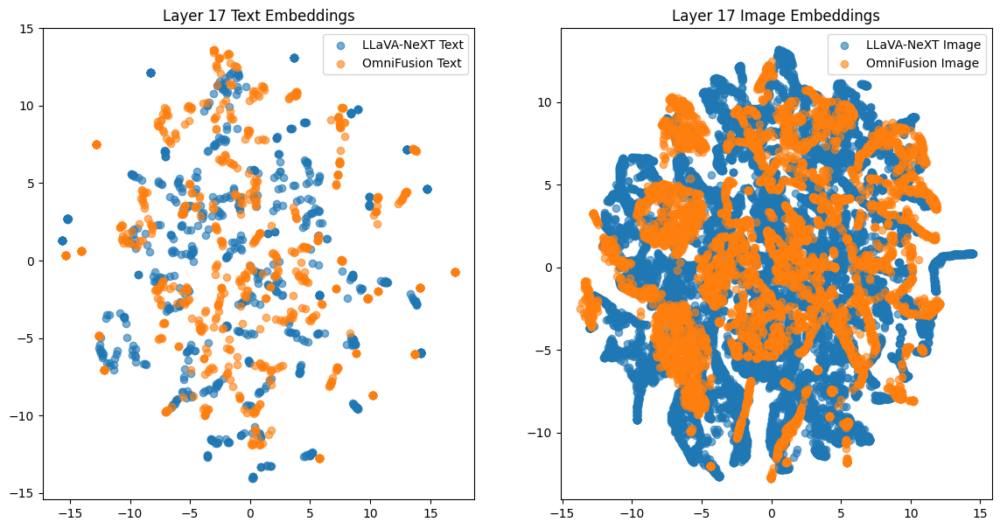

/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


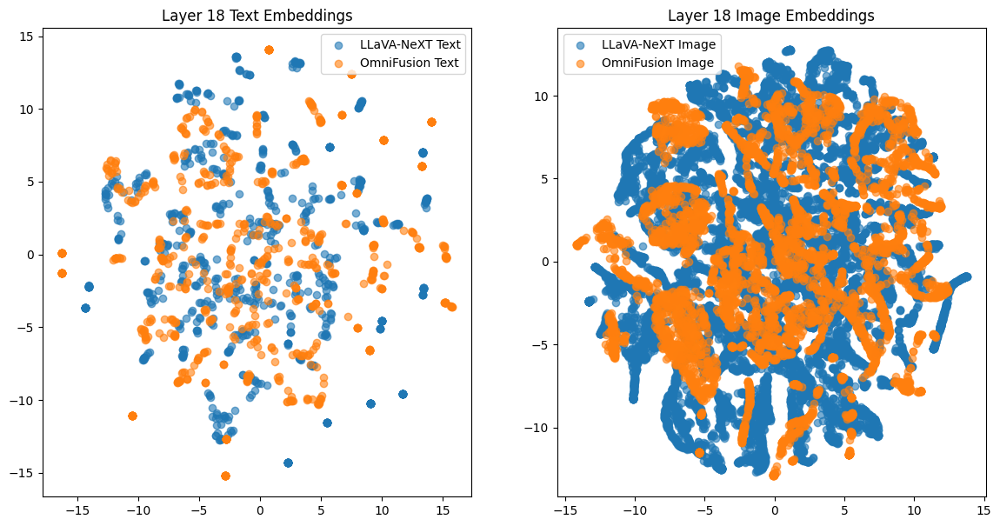

/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


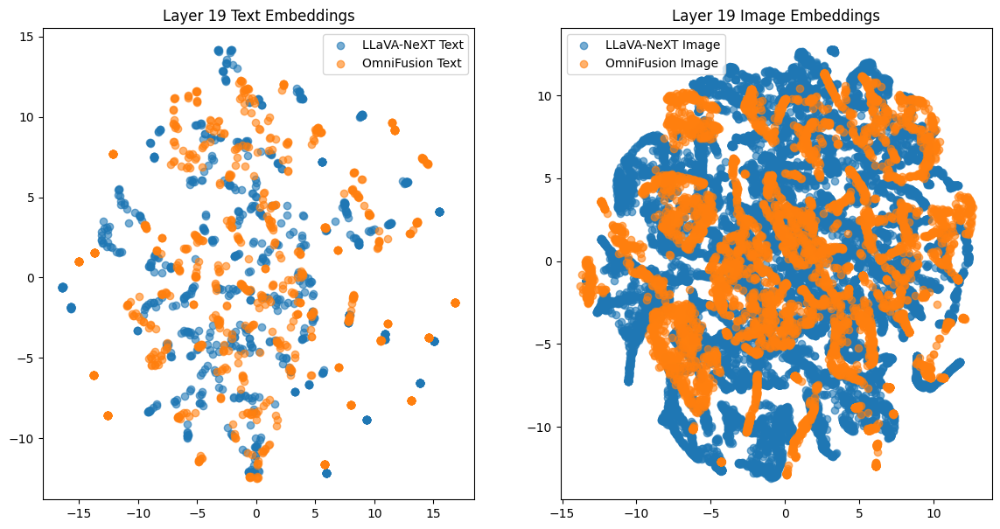

/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


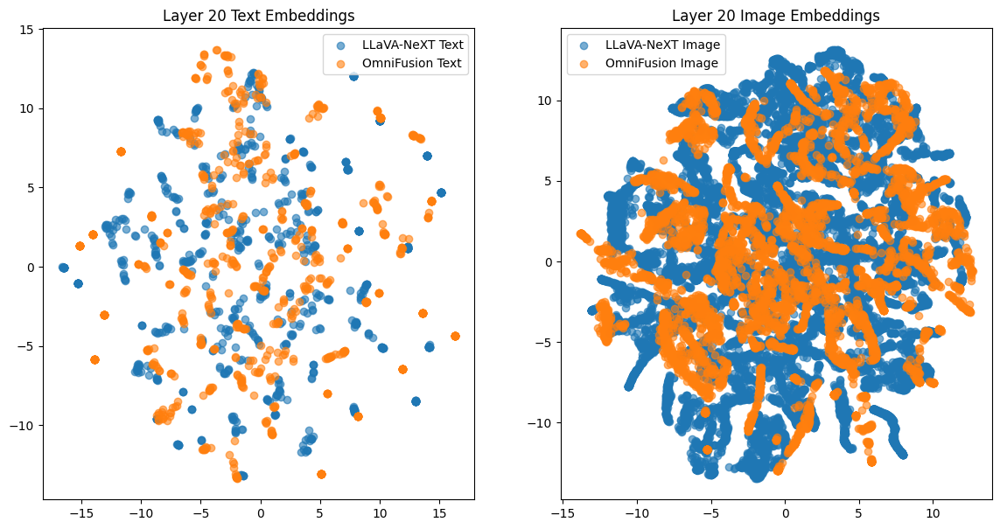

/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


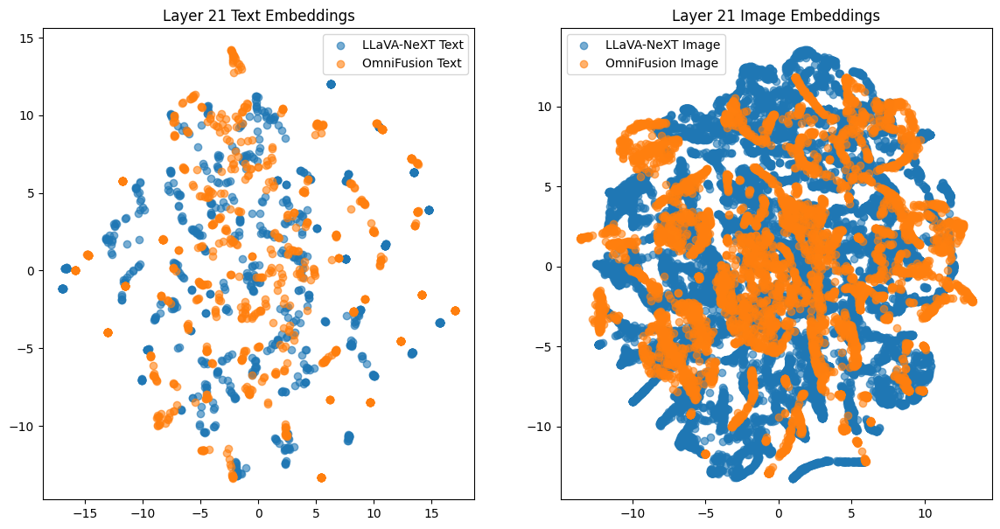

/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


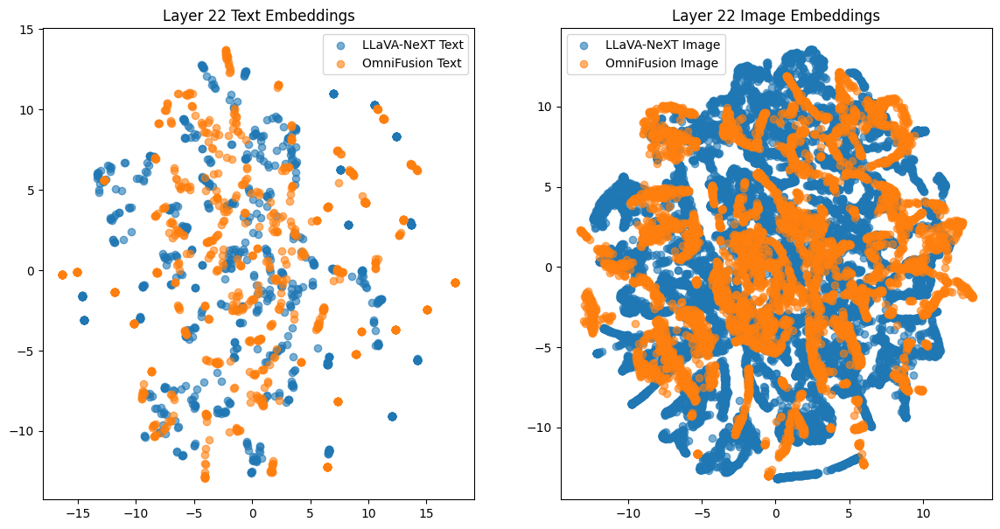

/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


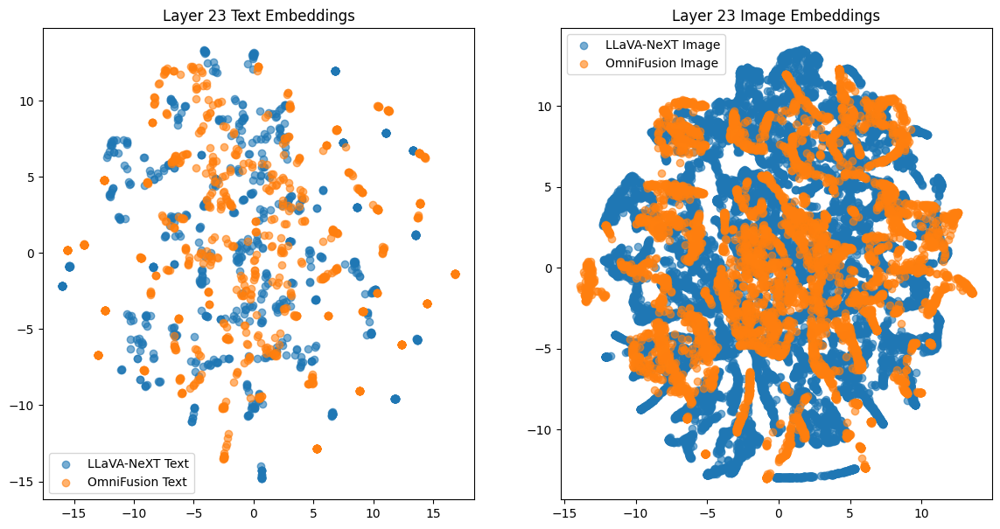

/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


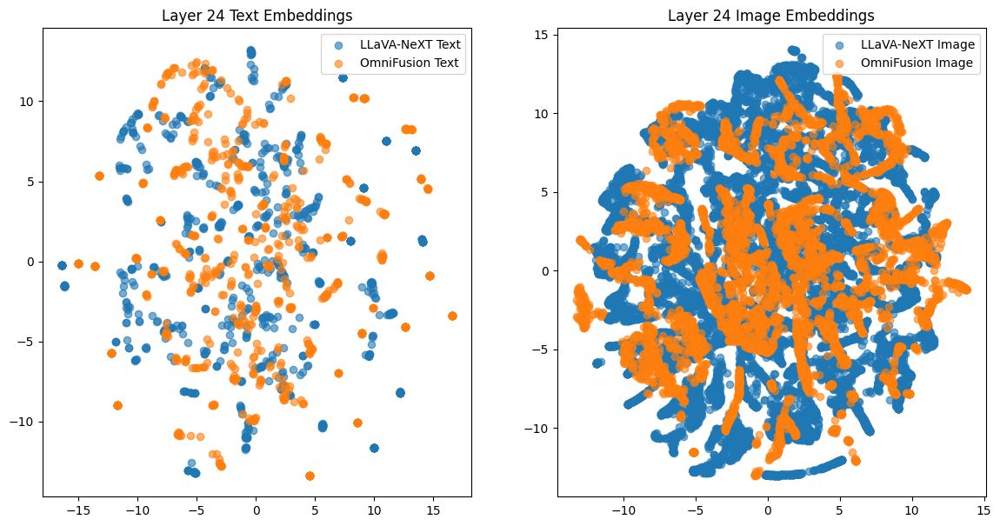

/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


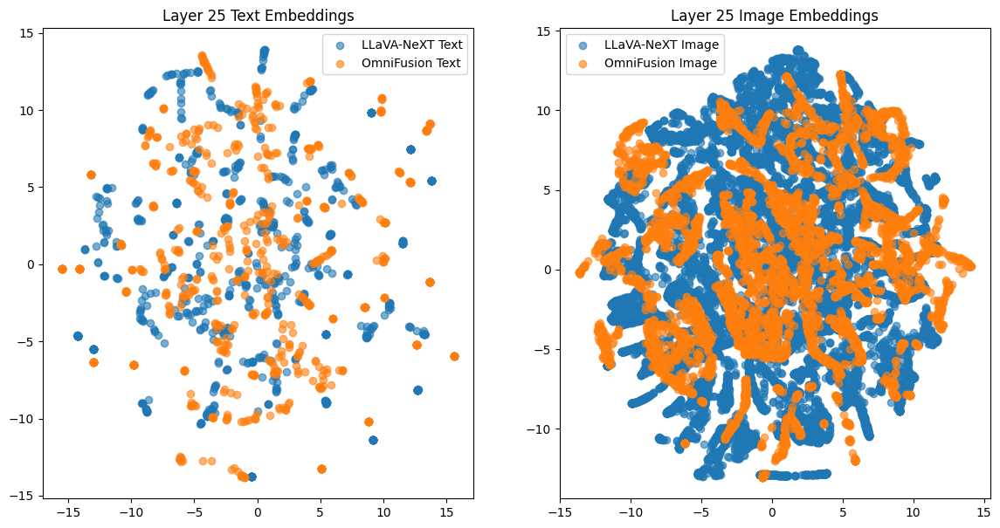

/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


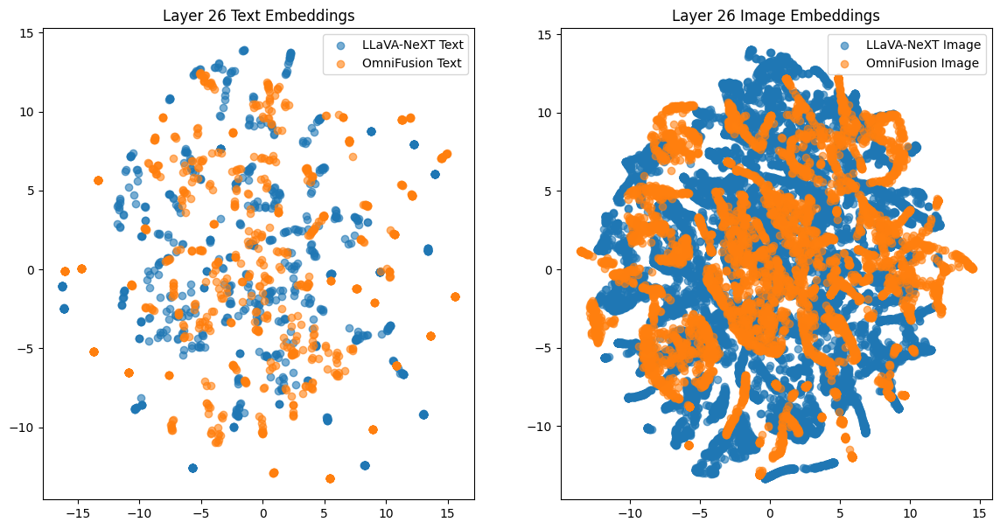

/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


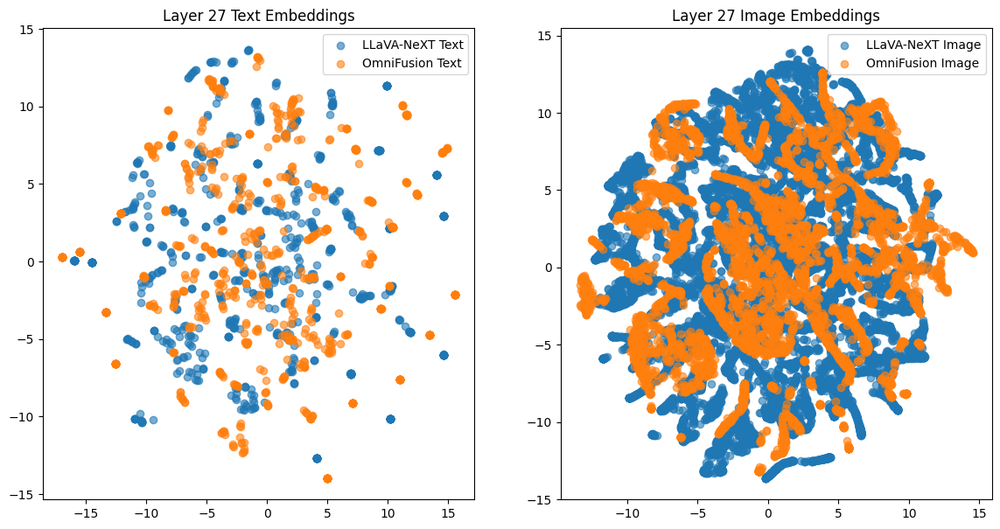

/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


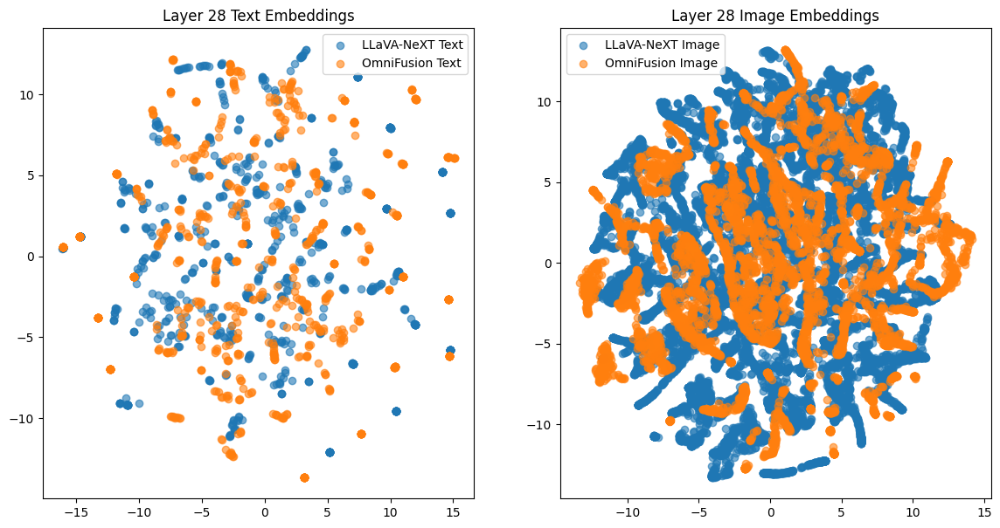

/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


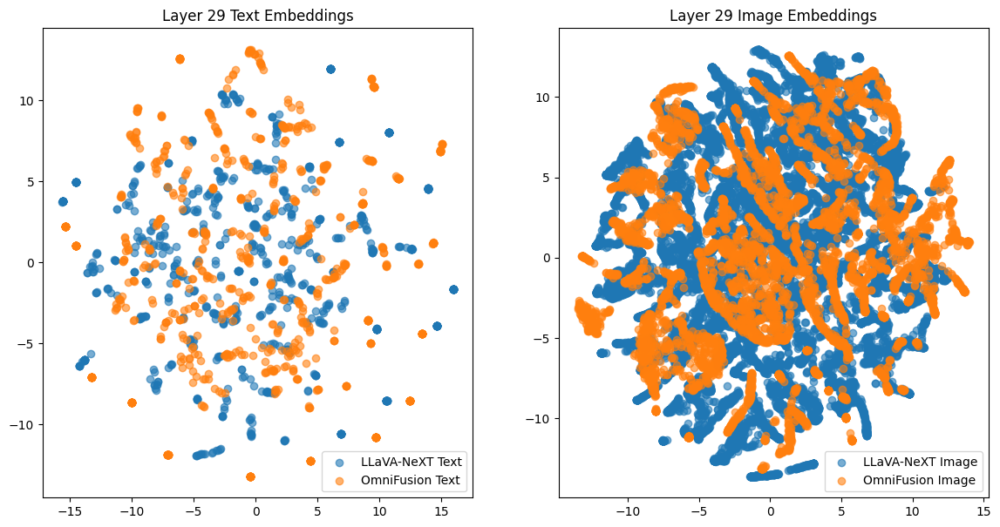

/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


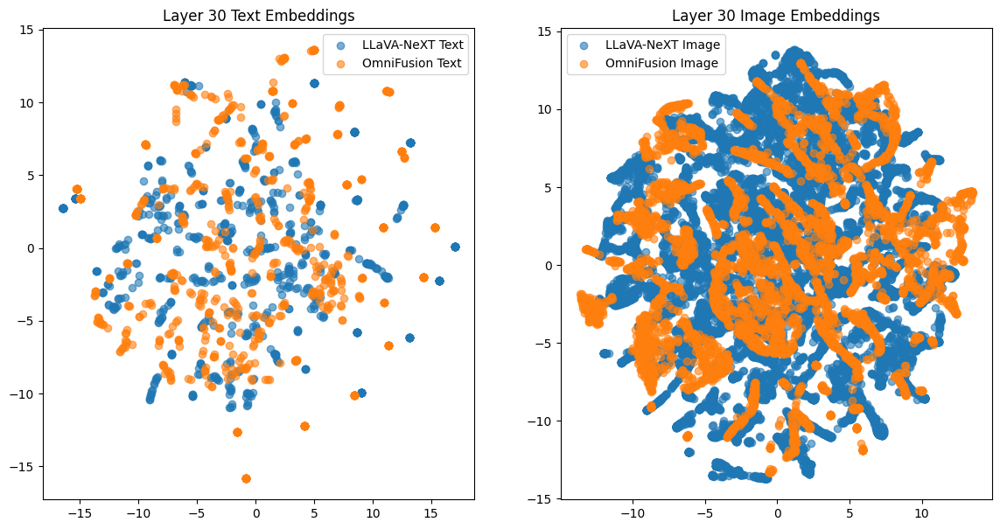

/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


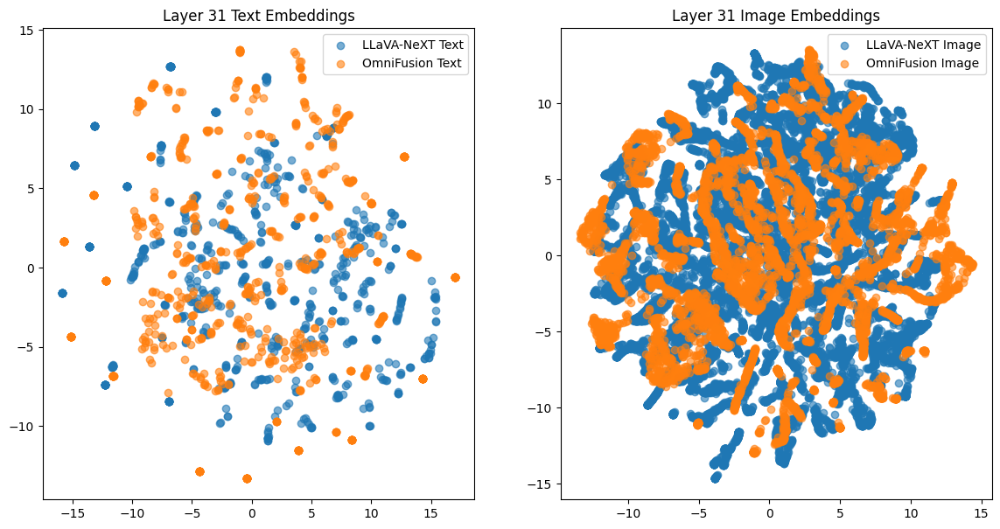

/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/home/ra.mussabayev/.conda/envs/python3.10-transformers/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


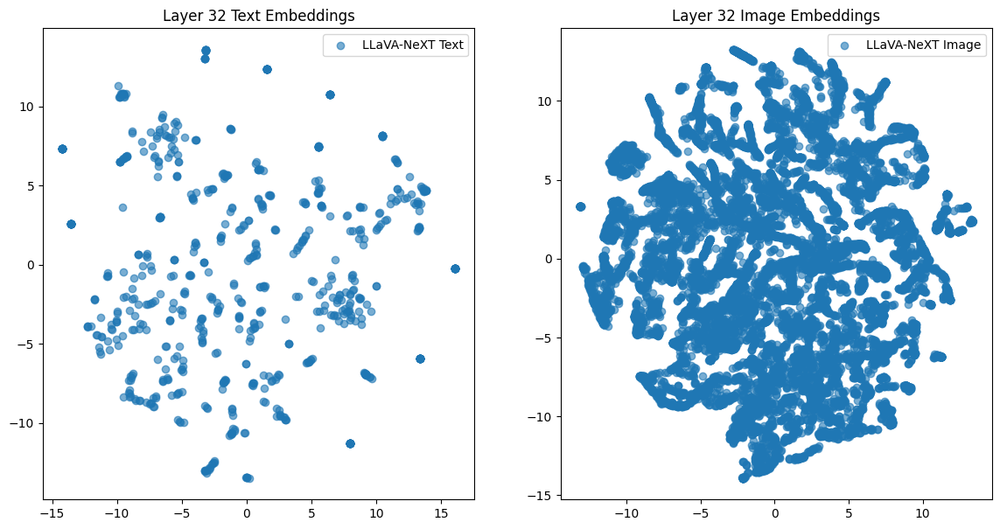

In [10]:
# Visualize the intermediate model embeddings
mllm_microscope.visualize_intermediate_embeddings(saving_path="./visualization")